In [ ]:
from os import chdir
from google.colab import drive

drive.mount("/content/drive", force_remount=True)
chdir("/content/drive/MyDrive/Projet")

Mounted at /content/drive


In [ ]:
import random
import pandas as pd
from os.path import join
from PIL import Image
import spacy
from matplotlib import pyplot as plt

from torch import nn, device as torch_device, cuda, cat, tensor, tanh
from torch.nn.utils.rnn import pad_sequence
import torchvision.models as models
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import torch.nn.functional as F

In [ ]:
# Load captions
PATH = "flickr8k/"
captions = pd.read_csv(PATH + "/captions.txt")
captions.iloc[0:2]

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .


In [ ]:
# Add <start> and <end> tags
captions.caption = captions.caption.apply(lambda x: f"<START> {x} <END>")
captions.iloc[0:2]

,image,caption
0,1000268201_693b08cb0e.jpg,<START> A child in a pink dress is climbing up...
1,1000268201_693b08cb0e.jpg,<START> A girl going into a wooden building . ...


In [ ]:
# Shuffle images
images = captions.image.unique()
random.shuffle(images)
images

array(['3477715432_79d82487bb.jpg', '1433577867_39a1510c43.jpg',
       '3303787342_b258b377b6.jpg', ..., '3135504530_0f4130d8f8.jpg',
       '357191373_a1cb5696e8.jpg', '3348385580_10b53391f9.jpg'],
      dtype=object)

In [ ]:
# Select a subset of images for training
N = 1000
train_images = images[:N]

train_data = captions.loc[captions.image.isin(train_images)].reset_index(drop=True)
train_data.iloc[0:2]

,image,caption
0,1009434119_febe49276a.jpg,<START> A black and white dog is running in a ...
1,1009434119_febe49276a.jpg,<START> A black and white dog is running throu...


<START> A black and white dog is running in a grassy garden surrounded by a white fence . <END>


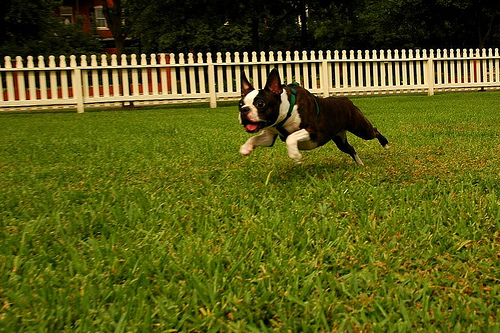

In [ ]:
print(train_data.caption[0])
pic = Image.open(PATH + "Images/" + train_data.image[0])
pic

In [ ]:
class DatasetLoader(Dataset):

    def __init__(self, img_path, captions_file, normalise=False):
        self.img_path = img_path
        self.df = pd.read_csv(captions_file)
        
        self.normalise = normalise
        self.magic_mu = [0.485, 0.456, 0.406]
        self.magic_sigma = [0.229, 0.224, 0.225]
        
        self.imgs = self.df["image"]
        self.captions = self.df["caption"]

        self.spacy_en = spacy.load('en_core_web_sm')
        self.word2idx = {"<START>": 0, "<END>": 1, "<UNK>": 2, "<PAD>": 3}
        self.idx2word = {i:w for w, i in self.word2idx.items()}

        self.transform = transforms.Compose([
            transforms.Resize((250, 250)),
            transforms.ToTensor()  # scale image to [0,1]
        ])


    def build_vocab(self):
        curr_idx = len(self.word2idx)
        freq_threshold = 2
        frequencies = dict()
        
        for sentence in self.captions:
            tokens = [str(token).lower() for token in self.spacy_en.tokenizer(sentence)]
            
            for tok in tokens:
                if tok in frequencies.keys():
                    frequencies[tok] += 1
                else:
                    frequencies[tok] = 1

                if frequencies[tok] == freq_threshold:
                    self.word2idx[tok] = curr_idx
                    self.idx2word[curr_idx] = tok
                    curr_idx += 1

    def tokenise(self, sentence):
        tokens = [str(token).lower() for token in self.spacy_en.tokenizer(sentence)]
        return [self.word2idx[tok] if tok in self.word2idx else self.word2idx["<UNK>"] for tok in tokens]
        
    
    def __len__(self):
        return self.df.shape[0]
    
    def __getitem__(self, idx):
        caption = self.captions[idx]
        img_name = self.imgs[idx]
        
        # Image
        img = Image.open(join(self.img_path, img_name))
        img = self.transform(img)

        if self.normalise:
            for c in range(3):
                img[c] -= self.magic_mu[c]
                img[c] /= self.magic_sigma[c]
        
        # Captions
        caption = tensor([self.word2idx["<START>"]] + self.tokenise(caption) + [self.word2idx["<END>"]])
        
        return img, caption

In [ ]:
dataset = DatasetLoader(img_path=PATH + "Images/", captions_file=PATH + "captions.txt")
dataset.build_vocab()

In [ ]:
def collate(batch, pad_idx):
    images = [item[0].unsqueeze(0) for item in batch]
    images = cat(images, dim=0)
    
    captions = [item[1] for item in batch]
    captions = pad_sequence(captions, batch_first=True, padding_value=pad_idx)
    return images, captions

collate_fn = lambda batch: collate(batch, dataset.word2idx["<PAD>"])

## Model

In [ ]:
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision.models as models
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T

In [ ]:
class EncoderCNN(nn.Module):
    def __init__(self, model="resnet"):
        super(EncoderCNN, self).__init__()

        if model == "vgg":
            features = models.vgg16(pretrained=True).features
            self.cnn = nn.Sequential(*list(features))
        elif model == "resnet":
            layers = models.resnet50(pretrained=True).children()
            self.cnn = nn.Sequential(*list(layers)[:-2])
        
        for param in self.cnn.parameters():
            param.requires_grad_(False)
        

    def forward(self, images):
        features = self.cnn(images)                                         # (batch, channels, h, w)
        features = features.permute(0, 2, 3, 1)                             # (batch, h, w, channels)
        features = features.view(features.size(0), -1, features.size(-1))   # (batch, h * w, channels)
        
        return features

In [ ]:
class Attention(nn.Module):
    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super().__init__()
        
        self.W1 = nn.Linear(encoder_dim, attention_dim)
        self.W2 = nn.Linear(decoder_dim, attention_dim)
        
        self.V = nn.Linear(attention_dim, 1)
        
        
    def forward(self, features, hidden_state):
        scores = torch.tanh(
            #(batch, layers, attention_dim) + (batch, attention_dim)
            self.W1(features) + self.W2(hidden_state).unsqueeze(1)
        ) # (batch, layers, attemtion_dim)
        
        scores = self.V(scores)     # (batch, layers, 1)
        scores = scores.squeeze(2)  # (batch, layers)
        
        
        alpha = F.softmax(scores, dim=1)  # (batch, layers)
        
        context = features * alpha.unsqueeze(2) # (batch, layers, features_dim)
        context = context.sum(dim=1)            # (batch, layers)
        
        return alpha, context

In [ ]:
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, vocab_size, attention_dim, encoder_dim, decoder_dim, dropout=0.2):
        super().__init__()
        
        self.vocab_size = vocab_size
        
        self.embedding = nn.Embedding(vocab_size, embed_size)
        self.attention = Attention(encoder_dim, decoder_dim, attention_dim)
        
        self.init_h = nn.Linear(encoder_dim, decoder_dim)  
        self.init_c = nn.Linear(encoder_dim, decoder_dim)

        self.lstm_cell = nn.LSTMCell(embed_size + encoder_dim, decoder_dim, bias=True)
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)
        
        self.fcn = nn.Linear(decoder_dim, vocab_size)
        self.dropout = nn.Dropout(dropout)
    

    def init_hidden_state(self, encoder_out):
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)
        c = self.init_c(mean_encoder_out)
        return h, c
        
    
    def forward(self, features, captions):
        # Vectorize the caption
        embeds = self.embedding(captions)
        
        # Initialize LSTM state
        h, c = self.init_hidden_state(features)  # (batch, decoder_dim)
        
        # Get the seq length to iterate
        seq_length = len(captions[0]) - 1  # Exclude the last one
        batch_size = captions.size(0)
        num_features = features.size(1)
        
        preds = torch.zeros(batch_size, seq_length, self.vocab_size).to(device)
        alphas = torch.zeros(batch_size, seq_length,num_features).to(device)
                
        for s in range(seq_length):
            alpha, context = self.attention(features, h)
            lstm_input = torch.cat((embeds[:, s], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))
                    
            output = self.fcn(self.dropout(h))
            
            preds[:, s] = output
            alphas[:, s] = alpha  
        
        return preds, alphas
    

    def predict_caption(self, features, max_len=20, word2idx=None, idx2word=None):
        batch_size = features.size(0)
        h, c = self.init_hidden_state(features)  # (batch, decoder_dim)
        
        word = torch.tensor(word2idx['<START>']).view(1, -1).to(device)
        embeds = self.embedding(word)

        alphas, captions = list(), list()
        
        for _ in range(max_len):
            alpha, context = self.attention(features, h)
            lstm_input = torch.cat((embeds[:, 0], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))
            
            output = self.fcn(self.dropout(h))
            output = output.view(batch_size, -1)
            
            alphas.append(alpha.cpu().detach().numpy())
            
            predicted_word_idx = output.argmax(dim=1)
            captions.append(predicted_word_idx.item())
            
            # End of sequence
            if idx2word[predicted_word_idx.item()] == "<END>":
                break
            
            # Send generated word as the next caption
            embeds = self.embedding(predicted_word_idx.unsqueeze(0))
        
        # Return corresponding words
        return [idx2word[idx] for idx in captions], alphas

In [ ]:
class EncoderDecoder(nn.Module):
    def __init__(self, embed_size, vocab_size, attention_dim, encoder_dim, decoder_dim, dropout=0.2):
        super().__init__()
        
        self.encoder = EncoderCNN()
        
        self.decoder = DecoderRNN(
            embed_size=embed_size,
            vocab_size=vocab_size,
            attention_dim=attention_dim,
            encoder_dim=encoder_dim,
            decoder_dim=decoder_dim,
            dropout=dropout
        )
        
    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        
        return outputs

In [ ]:
# Hyperparameters
batch_size = 20
embed_size = 300
vocab_size = len(dataset.word2idx)
attention_dim = 256
encoder_dim = 2048
decoder_dim = 512
learning_rate = 1e-3
epochs = 10

In [ ]:
data_loader = DataLoader(
    dataset=dataset,
    batch_size=batch_size,
    num_workers=2,
    shuffle=True,
    collate_fn=collate_fn
)

device = torch_device('cuda:0' if cuda.is_available() else "cpu")
print("device:", device)

#init model
model = EncoderDecoder(
    embed_size=embed_size,
    vocab_size=vocab_size,
    attention_dim=attention_dim,
    encoder_dim=encoder_dim,
    decoder_dim=decoder_dim
).to(device)

loss_criterion = nn.CrossEntropyLoss(ignore_index=dataset.word2idx["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

device: cuda:0


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

In [ ]:
def save_model(model,num_epochs):
    model_state = {
        'num_epochs': num_epochs,
        'embed_size': embed_size,
        'vocab_size': len(dataset.word2idx),
        'attention_dim': attention_dim,
        'encoder_dim': encoder_dim,
        'decoder_dim': decoder_dim,
        'state_dict': model.state_dict()
    }

    torch.save(model_state, 'attention_model_state.pth')


def show_image(img, title=None):
    # Unnormalise
    img[0] = img[0] * 0.229 + 0.485
    img[1] = img[1] * 0.224 + 0.456
    img[2] = img[2] * 0.225 + 0.406
    
    img = img.numpy().transpose((1, 2, 0))
    if title is not None: plt.title(title)

    plt.imshow(img)
    plt.pause(1e-3)

def generate_caption(model, features_tensors):
    model.eval()
    with torch.no_grad():
        features = model.encoder(features_tensors[0:1].to(device))
        caps, alphas = model.decoder.predict_caption(features, word2idx=dataset.word2idx, idx2word=dataset.idx2word)
        caption = ' '.join(caps)
        show_image(img[0], title=caption)
    
    return caps, alphas

Epoch: 1 loss: 4.55678


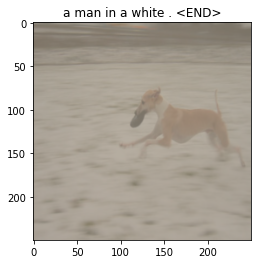

Epoch: 1 loss: 4.05681


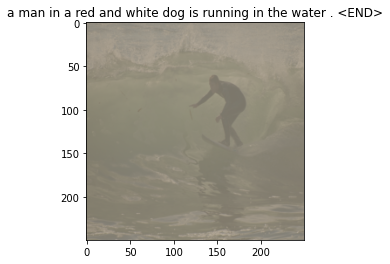

Epoch: 1 loss: 3.79432


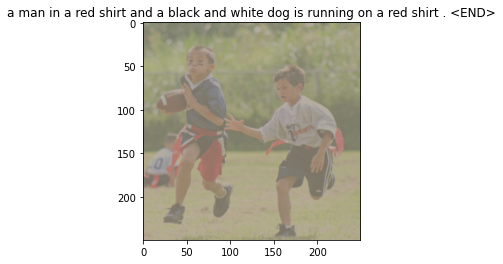

Epoch: 1 loss: 3.73248


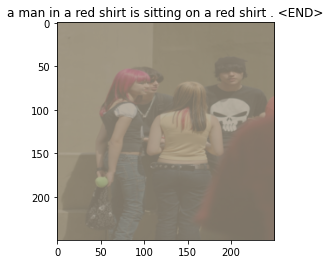

Epoch: 1 loss: 3.14018


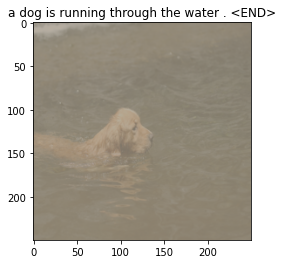

Epoch: 1 loss: 3.58852


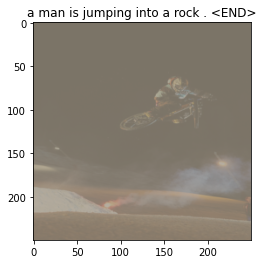

Epoch: 1 loss: 3.62977


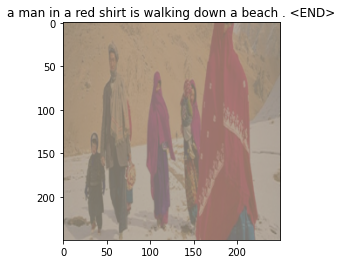

Epoch: 1 loss: 3.29066


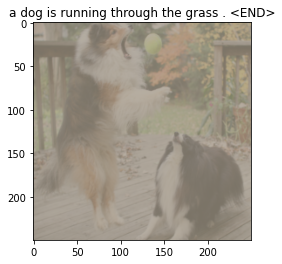

Epoch: 1 loss: 3.63821


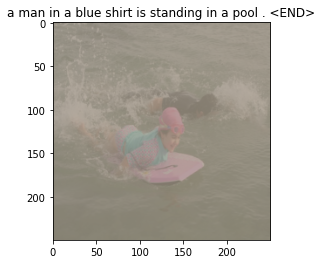

Epoch: 1 loss: 3.34824


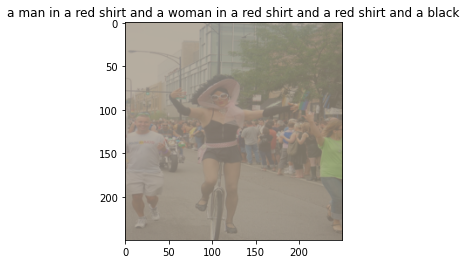

Epoch: 1 loss: 3.34247


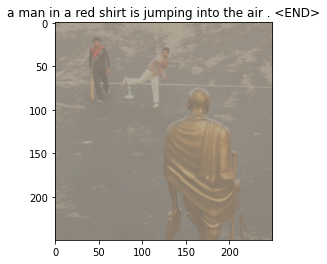

Epoch: 1 loss: 3.28170


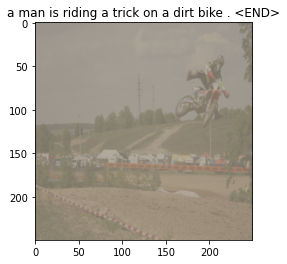

Epoch: 1 loss: 3.15861


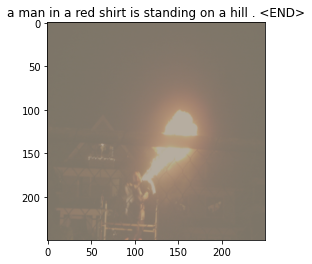

Epoch: 1 loss: 3.15443


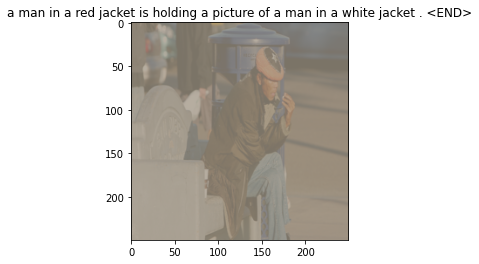

Epoch: 1 loss: 3.25004


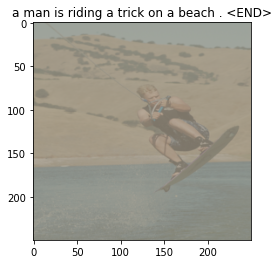

Epoch: 1 loss: 3.43387


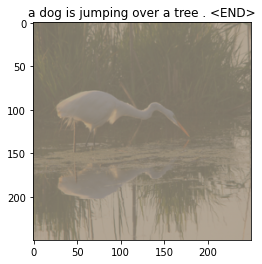

Epoch: 1 loss: 3.15587


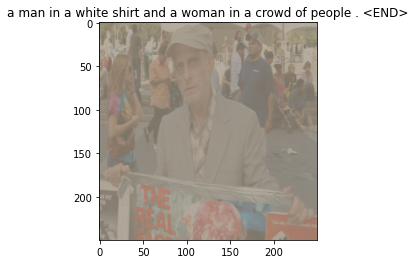

Epoch: 1 loss: 3.12879


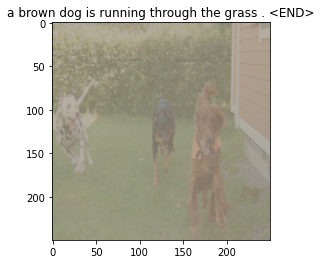

Epoch: 1 loss: 3.34221


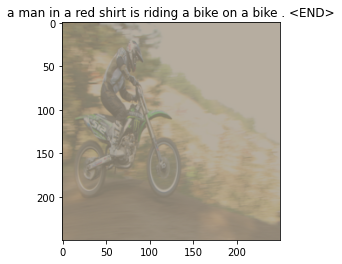

Epoch: 1 loss: 3.05728


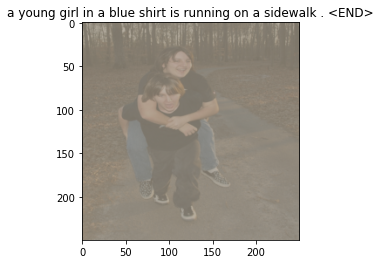

Epoch: 2 loss: 3.19416


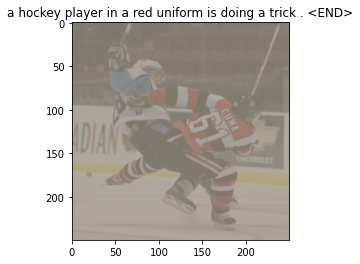

Epoch: 2 loss: 3.39964


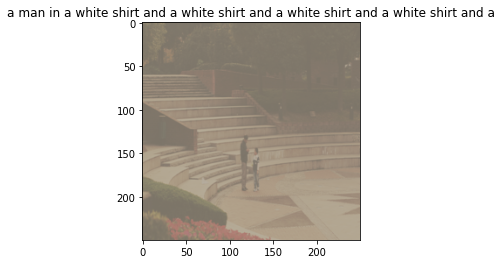

Epoch: 2 loss: 3.02169


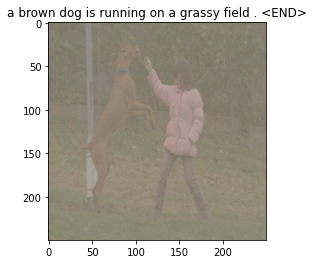

Epoch: 2 loss: 3.03241


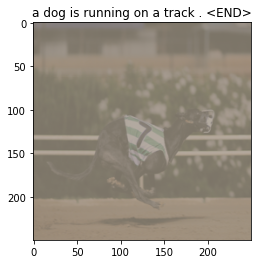

Epoch: 2 loss: 3.23801


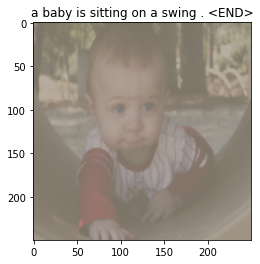

Epoch: 2 loss: 3.04465


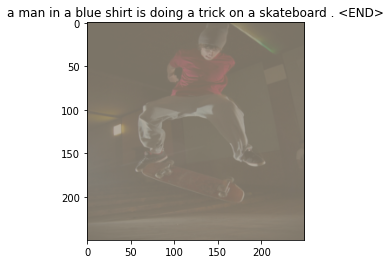

Epoch: 2 loss: 2.74716


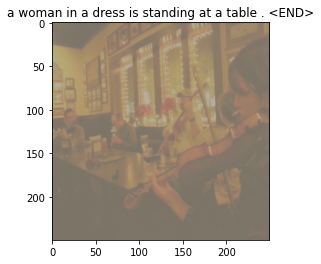

Epoch: 2 loss: 2.98671


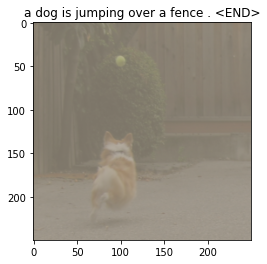

Epoch: 2 loss: 3.18130


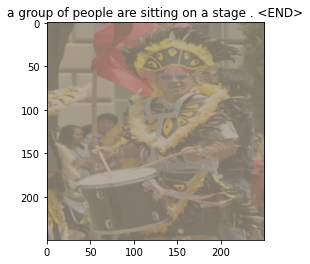

Epoch: 2 loss: 2.83706


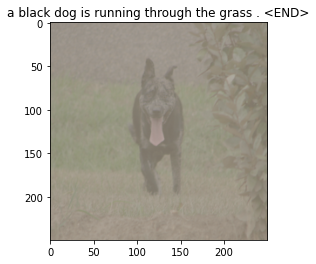

Epoch: 2 loss: 2.73465


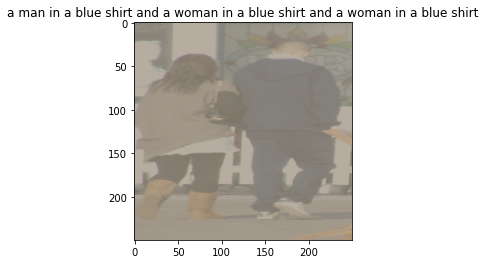

Epoch: 2 loss: 2.95159


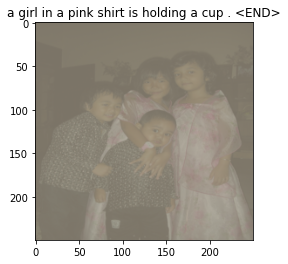

Epoch: 2 loss: 3.05936


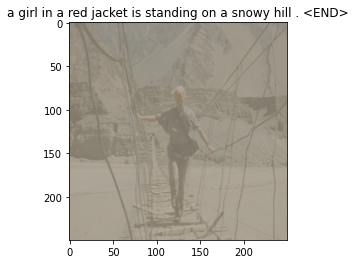

Epoch: 2 loss: 2.96416


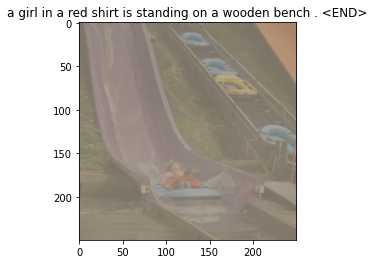

Epoch: 2 loss: 2.87198


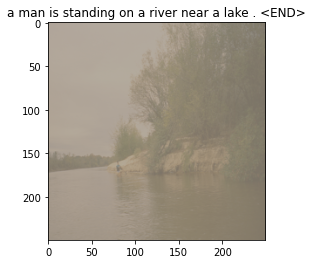

Epoch: 2 loss: 3.08867


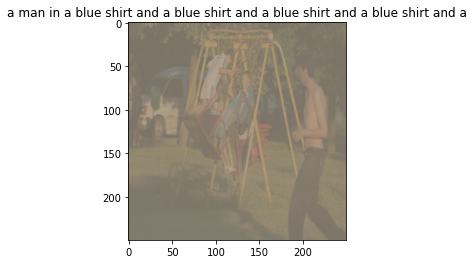

Epoch: 2 loss: 2.91957


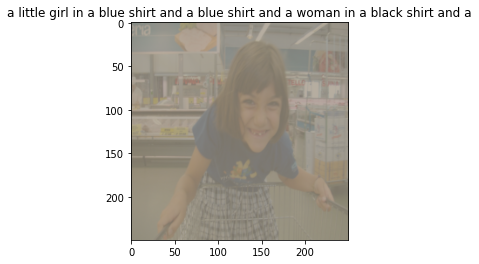

Epoch: 2 loss: 2.70470


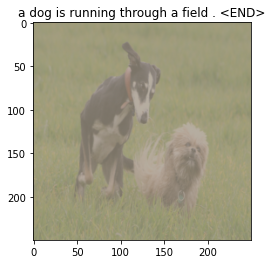

Epoch: 2 loss: 2.81185


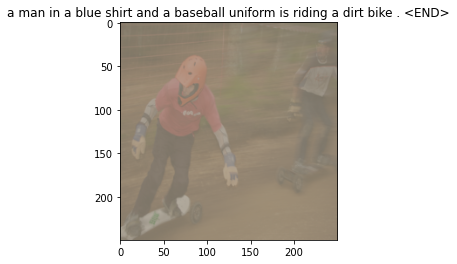

Epoch: 2 loss: 2.92936


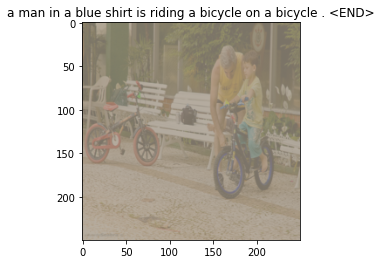

Epoch: 3 loss: 2.42679


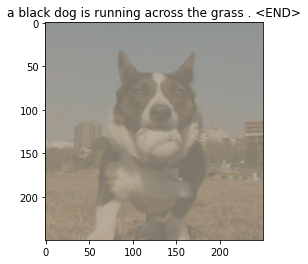

Epoch: 3 loss: 2.63444


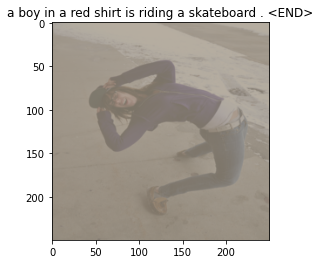

Epoch: 3 loss: 2.98800


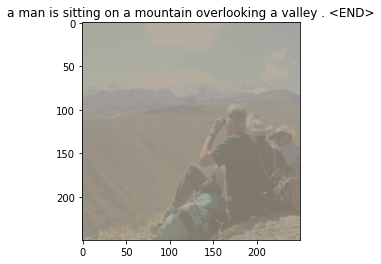

Epoch: 3 loss: 2.80410


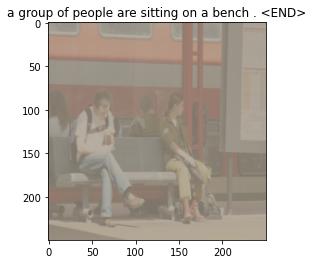

Epoch: 3 loss: 2.75132


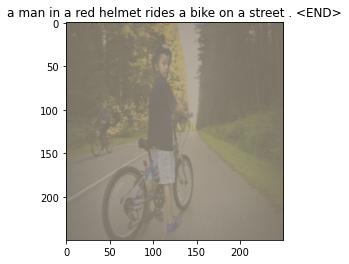

Epoch: 3 loss: 3.08498


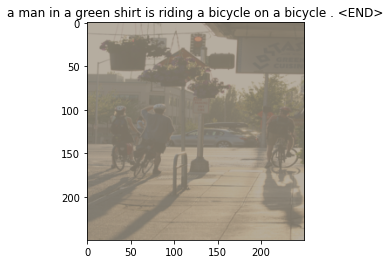

Epoch: 3 loss: 2.41628


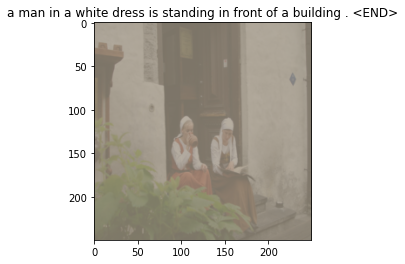

Epoch: 3 loss: 2.60485


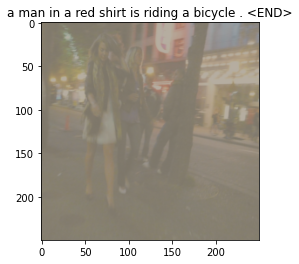

Epoch: 3 loss: 2.85998


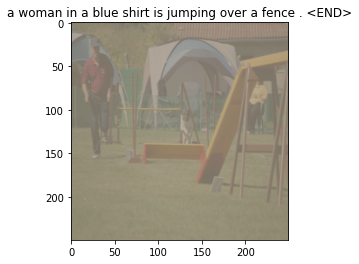

Epoch: 3 loss: 2.61977


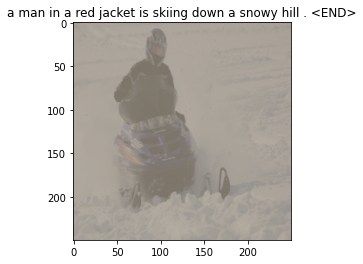

Epoch: 3 loss: 2.34925


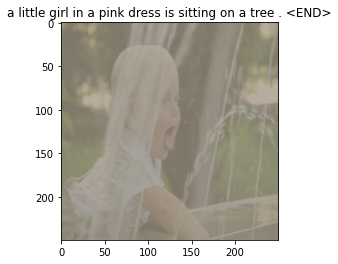

Epoch: 3 loss: 2.67977


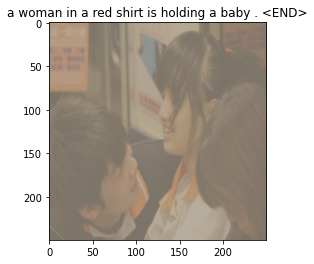

Epoch: 3 loss: 2.46932


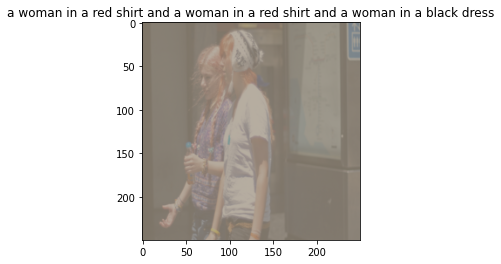

Epoch: 3 loss: 2.65143


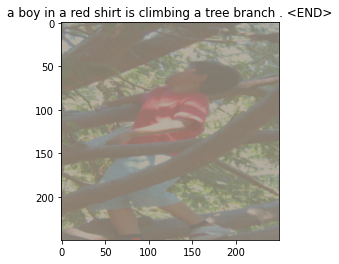

Epoch: 3 loss: 2.70369


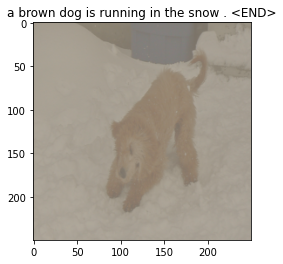

Epoch: 3 loss: 2.88132


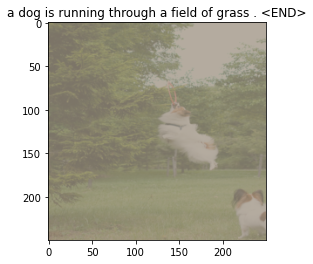

Epoch: 3 loss: 2.48395


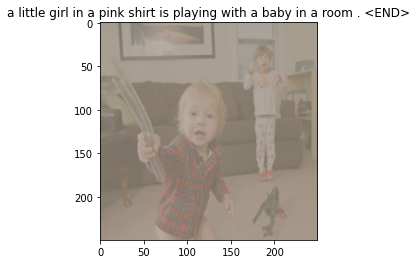

Epoch: 3 loss: 2.78897


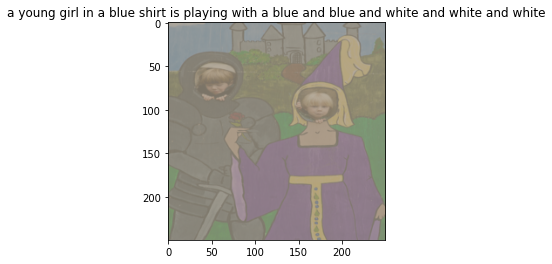

Epoch: 3 loss: 2.68064


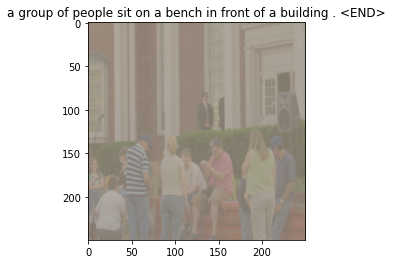

Epoch: 3 loss: 2.79281


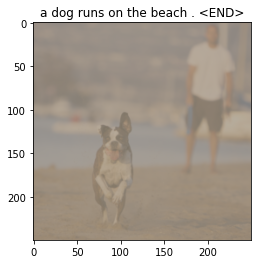

Epoch: 4 loss: 2.79048


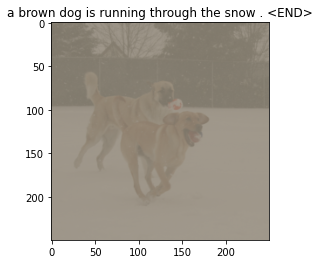

Epoch: 4 loss: 2.44985


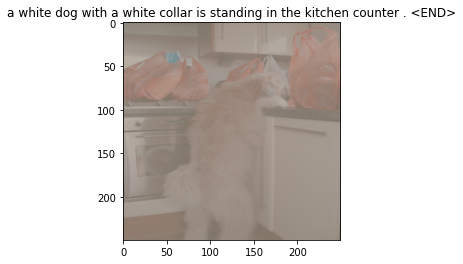

Epoch: 4 loss: 2.16466


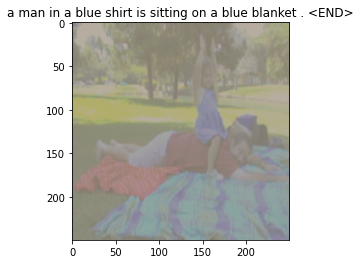

Epoch: 4 loss: 2.41932


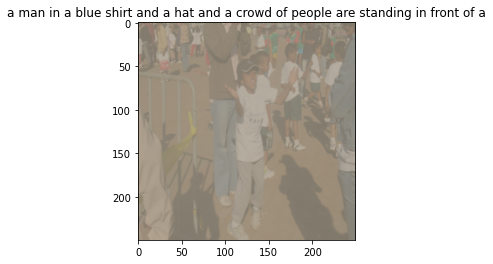

Epoch: 4 loss: 2.47093


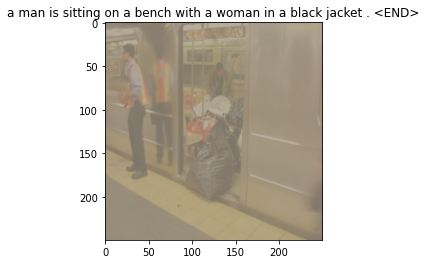

Epoch: 4 loss: 2.77475


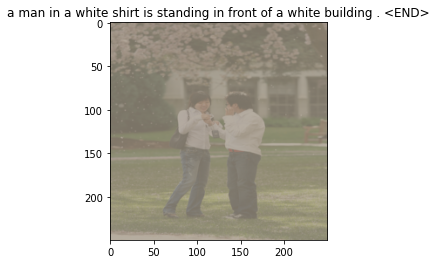

Epoch: 4 loss: 2.47633


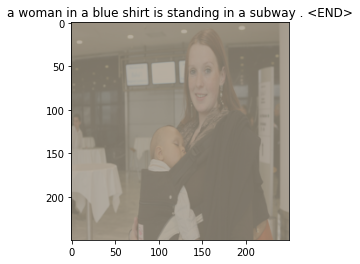

Epoch: 4 loss: 2.27152


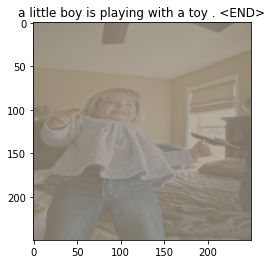

Epoch: 4 loss: 2.82554


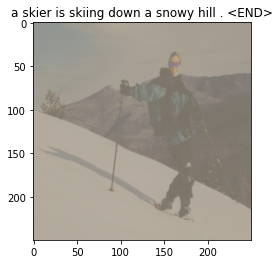

Epoch: 4 loss: 2.59870


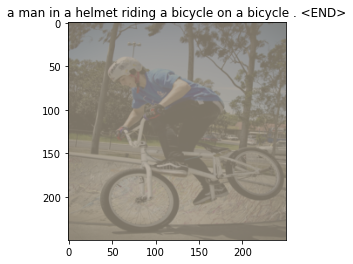

Epoch: 4 loss: 2.52574


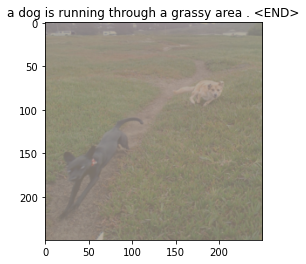

Epoch: 4 loss: 2.26902


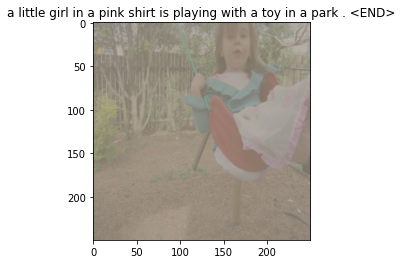

Epoch: 4 loss: 2.30383


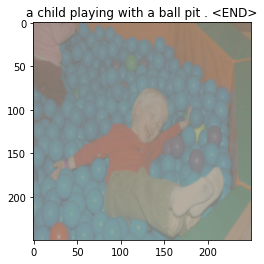

Epoch: 4 loss: 2.62491


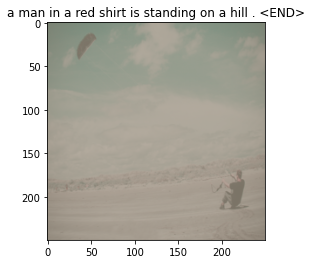

Epoch: 4 loss: 2.45950


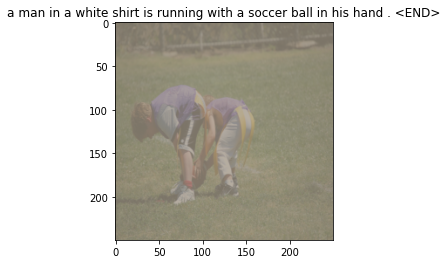

Epoch: 4 loss: 2.41465


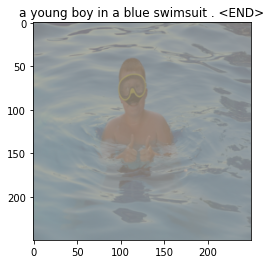

Epoch: 4 loss: 2.52386


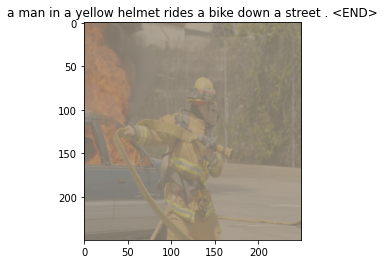

Epoch: 4 loss: 2.66719


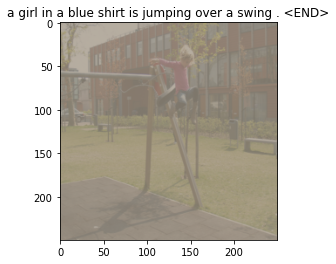

Epoch: 4 loss: 2.40878


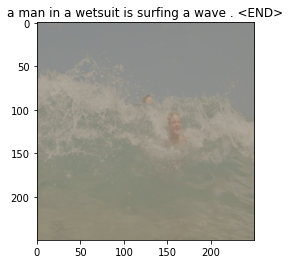

Epoch: 4 loss: 2.54089


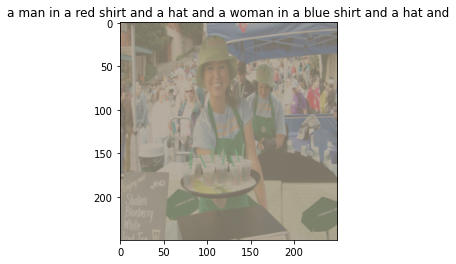

Epoch: 5 loss: 2.31348


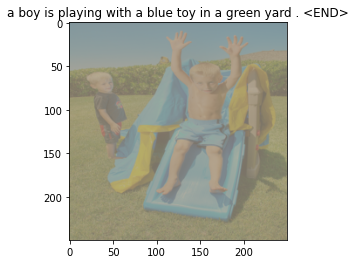

Epoch: 5 loss: 2.29104


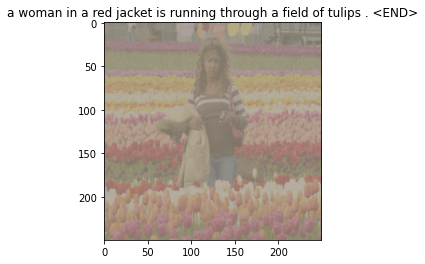

Epoch: 5 loss: 2.29004


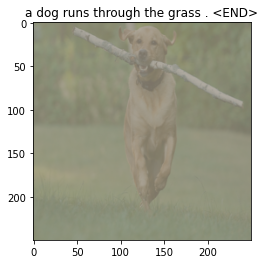

Epoch: 5 loss: 2.33247


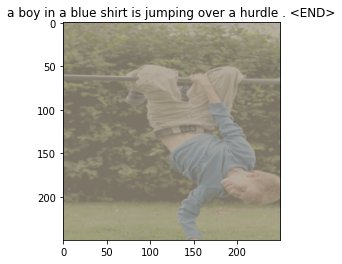

Epoch: 5 loss: 2.49468


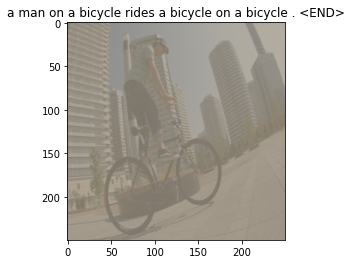

Epoch: 5 loss: 2.19232


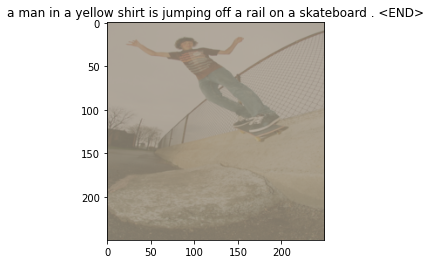

Epoch: 5 loss: 2.11733


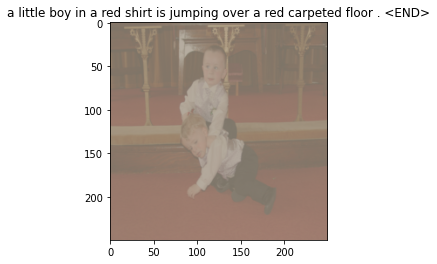

Epoch: 5 loss: 2.73404


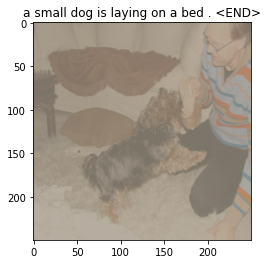

Epoch: 5 loss: 2.28662


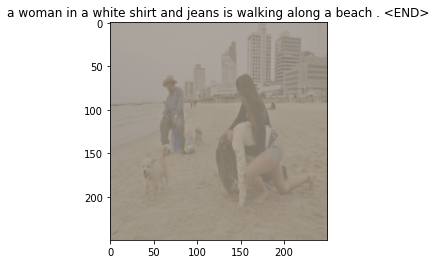

Epoch: 5 loss: 2.19636


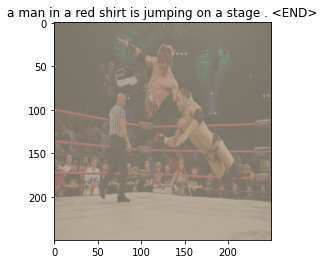

Epoch: 5 loss: 2.54945


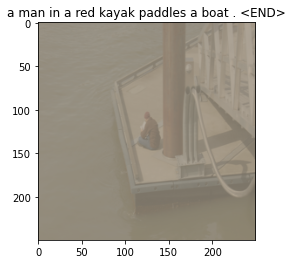

Epoch: 5 loss: 2.47494


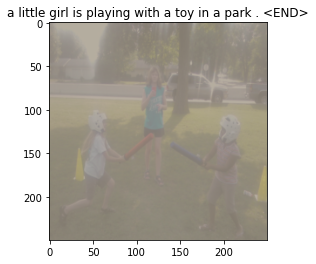

Epoch: 5 loss: 2.29827


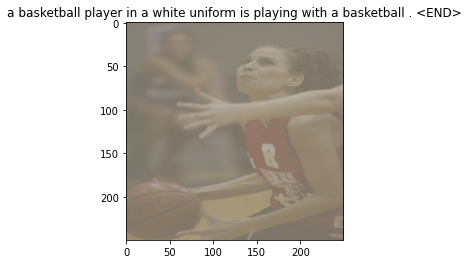

Epoch: 5 loss: 2.27902


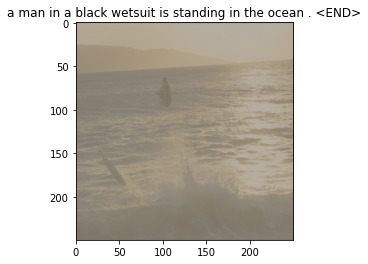

Epoch: 5 loss: 2.33201


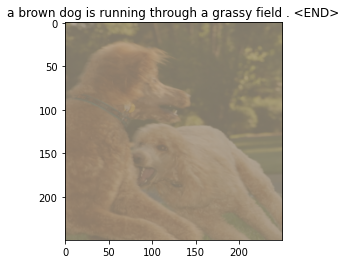

Epoch: 5 loss: 2.35993


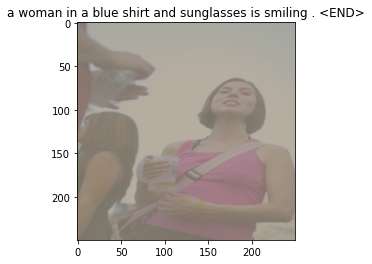

Epoch: 5 loss: 2.42075


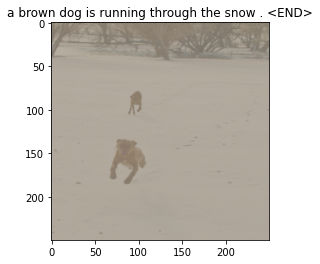

Epoch: 5 loss: 2.12476


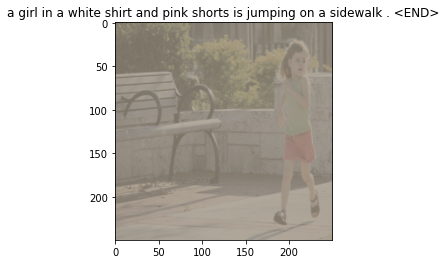

Epoch: 5 loss: 2.07080


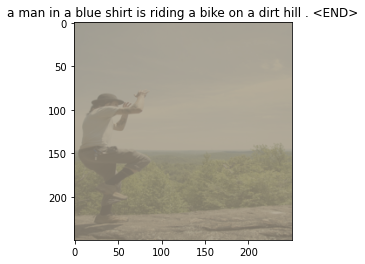

Epoch: 5 loss: 2.30277


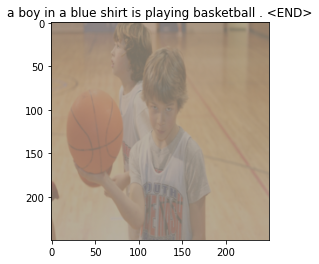

Epoch: 6 loss: 2.02669


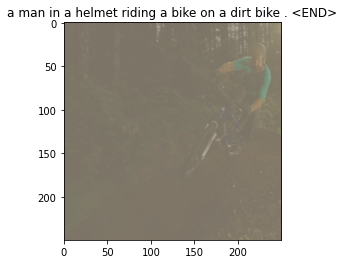

Epoch: 6 loss: 2.53877


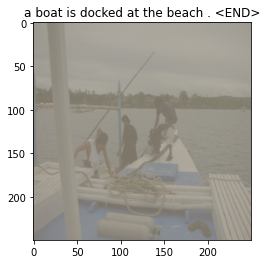

Epoch: 6 loss: 2.32774


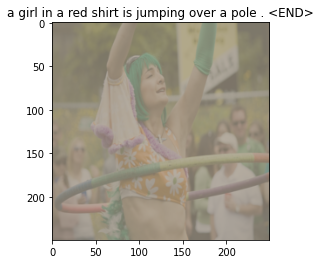

Epoch: 6 loss: 2.09499


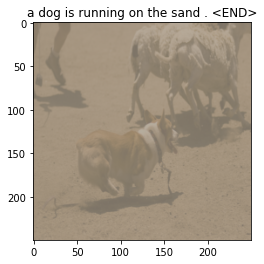

Epoch: 6 loss: 2.16724


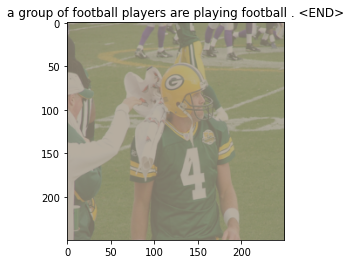

Epoch: 6 loss: 2.05210


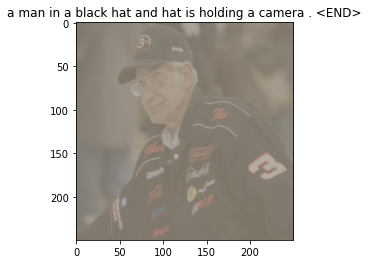

Epoch: 6 loss: 2.39997


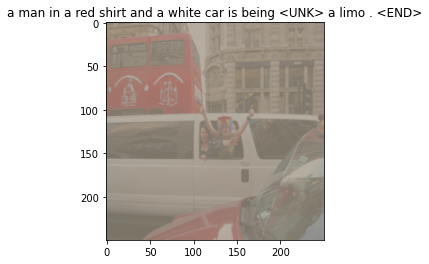

Epoch: 6 loss: 2.36028


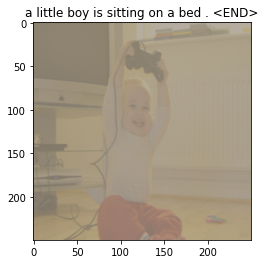

Epoch: 6 loss: 2.49086


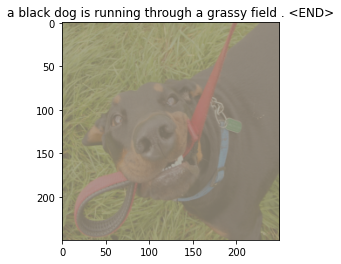

Epoch: 6 loss: 2.37046


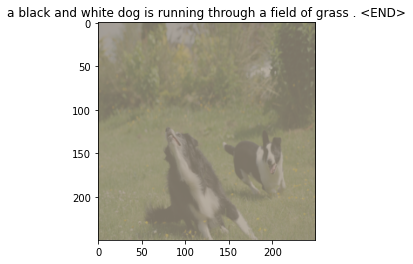

Epoch: 6 loss: 2.38227


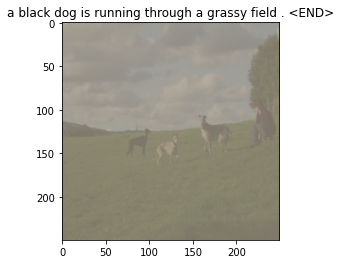

Epoch: 6 loss: 2.22994


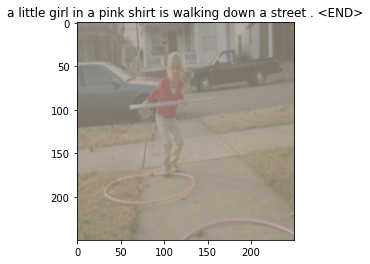

Epoch: 6 loss: 2.01190


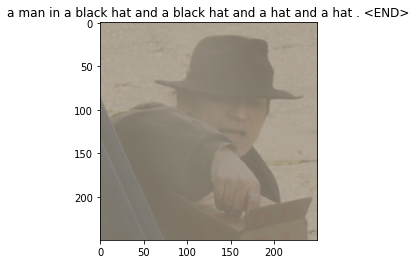

Epoch: 6 loss: 2.59021


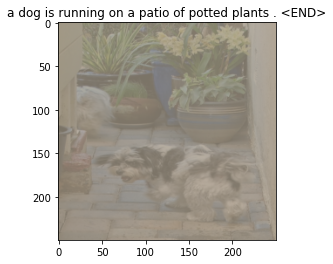

Epoch: 6 loss: 2.61846


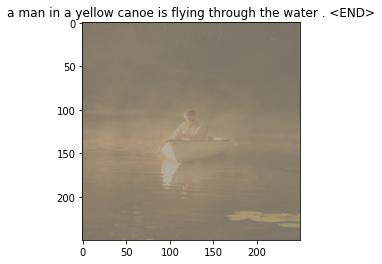

Epoch: 6 loss: 2.46728


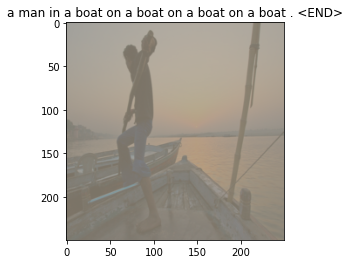

Epoch: 6 loss: 2.30867


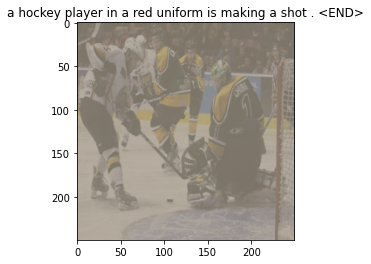

Epoch: 6 loss: 2.36100


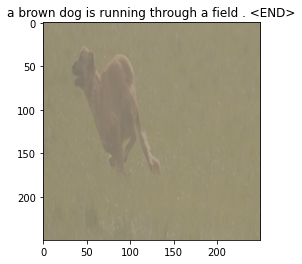

Epoch: 6 loss: 2.32304


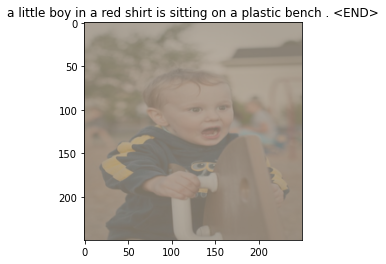

Epoch: 6 loss: 2.37012


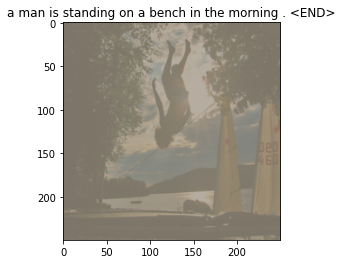

Epoch: 7 loss: 2.19100


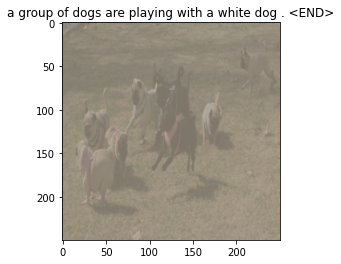

Epoch: 7 loss: 2.14079


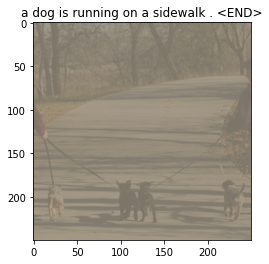

Epoch: 7 loss: 2.24137


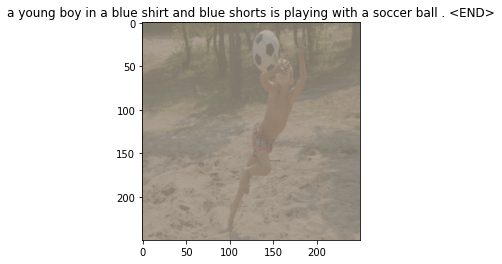

Epoch: 7 loss: 1.96886


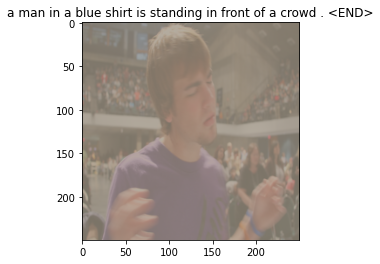

Epoch: 7 loss: 2.35118


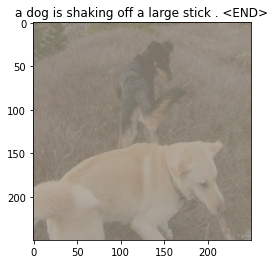

Epoch: 7 loss: 2.30461


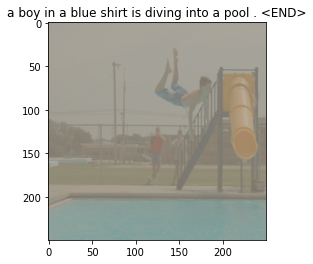

Epoch: 7 loss: 2.29303


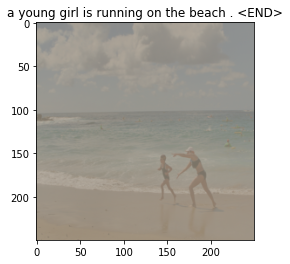

Epoch: 7 loss: 1.97049


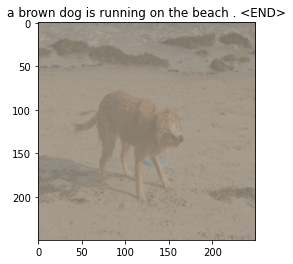

Epoch: 7 loss: 2.06867


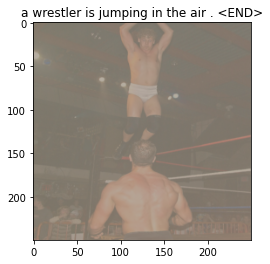

Epoch: 7 loss: 2.17515


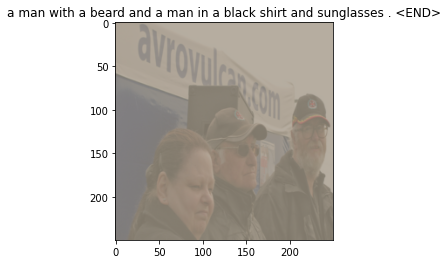

Epoch: 7 loss: 2.10567


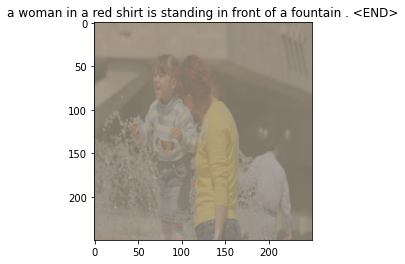

Epoch: 7 loss: 2.07014


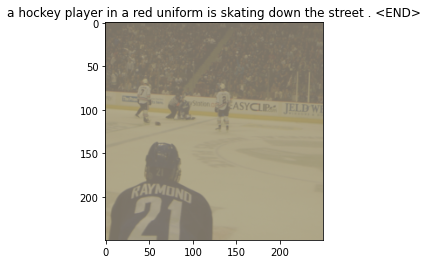

Epoch: 7 loss: 2.31852


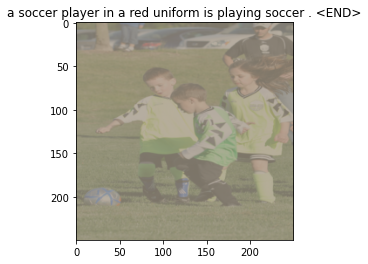

Epoch: 7 loss: 2.22277


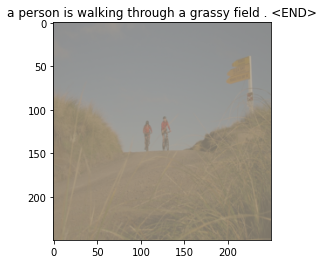

Epoch: 7 loss: 2.16215


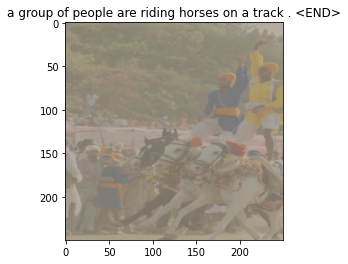

Epoch: 7 loss: 2.12817


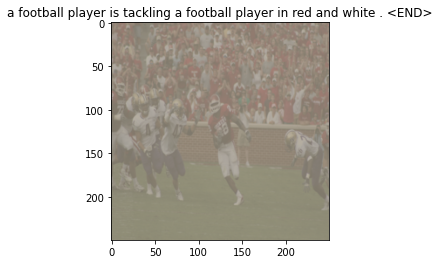

Epoch: 7 loss: 2.06903


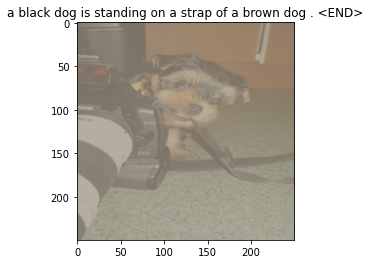

Epoch: 7 loss: 2.03438


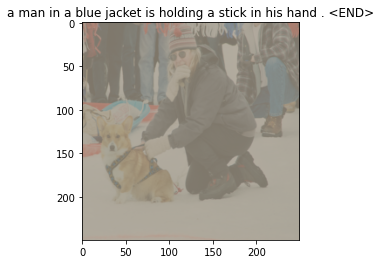

Epoch: 7 loss: 2.09803


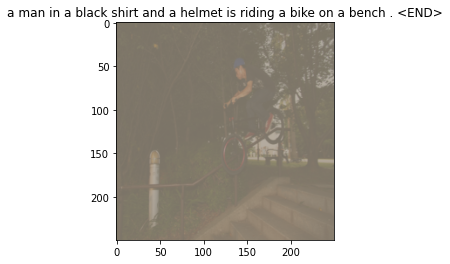

Epoch: 7 loss: 2.32195


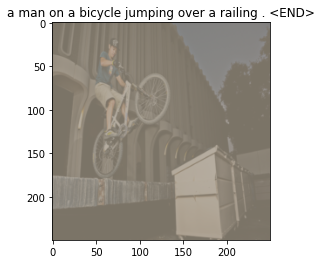

Epoch: 8 loss: 2.03640


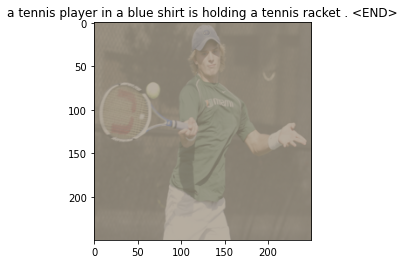

Epoch: 8 loss: 1.94214


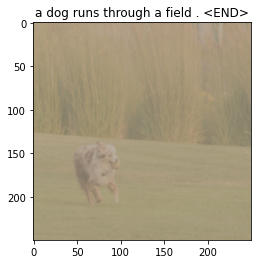

Epoch: 8 loss: 1.97182


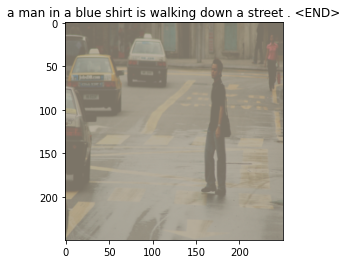

Epoch: 8 loss: 1.82980


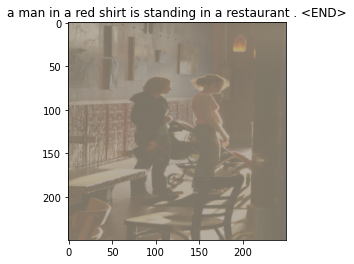

Epoch: 8 loss: 2.02200


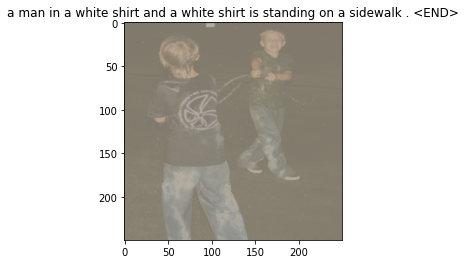

Epoch: 8 loss: 2.00345


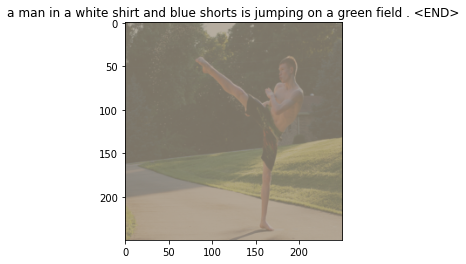

Epoch: 8 loss: 2.04330


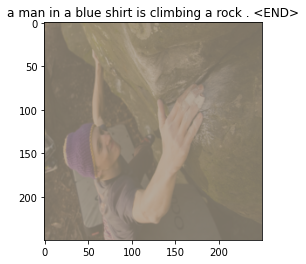

Epoch: 8 loss: 2.05968


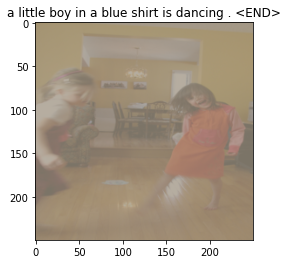

Epoch: 8 loss: 2.05625


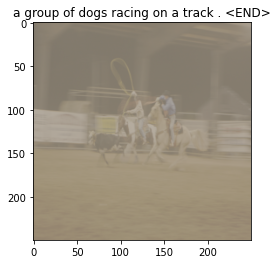

Epoch: 8 loss: 2.14284


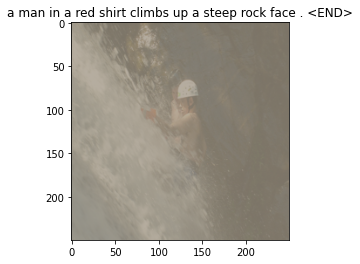

Epoch: 8 loss: 2.24003


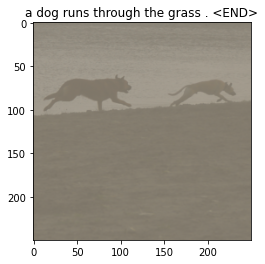

Epoch: 8 loss: 2.07976


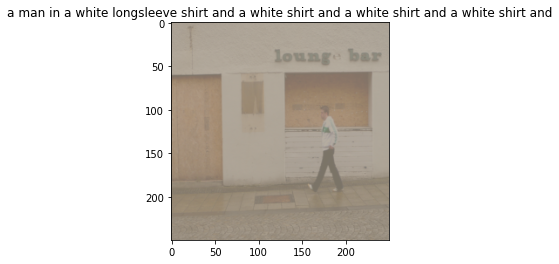

Epoch: 8 loss: 2.06496


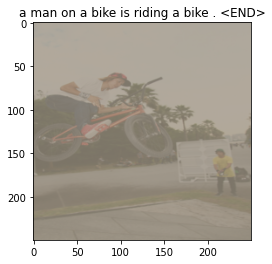

Epoch: 8 loss: 2.00970


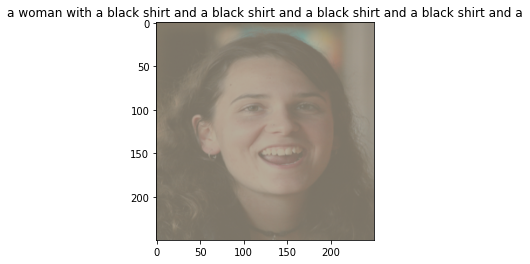

Epoch: 8 loss: 2.25835


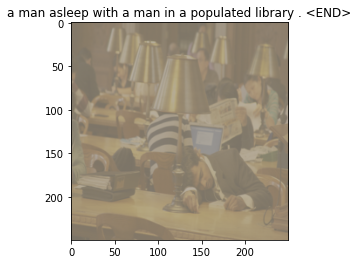

Epoch: 8 loss: 2.38810


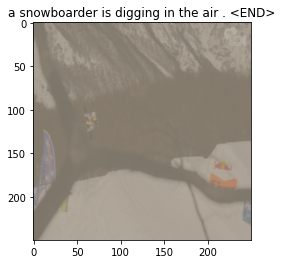

Epoch: 8 loss: 2.21740


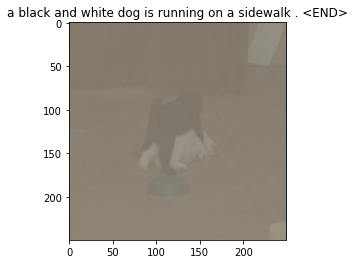

Epoch: 8 loss: 2.08485


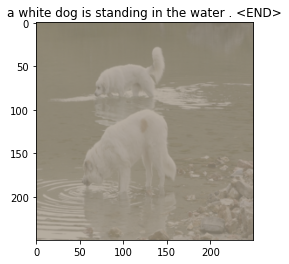

Epoch: 8 loss: 2.01169


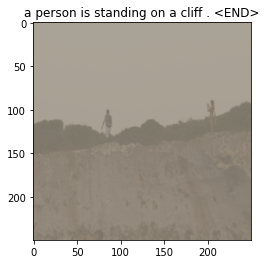

Epoch: 8 loss: 2.27091


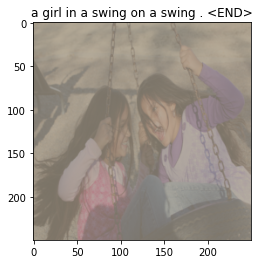

Epoch: 9 loss: 2.00515


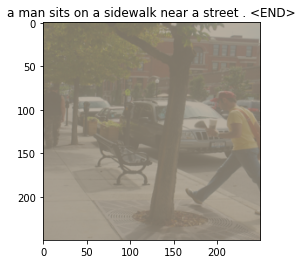

Epoch: 9 loss: 1.80266


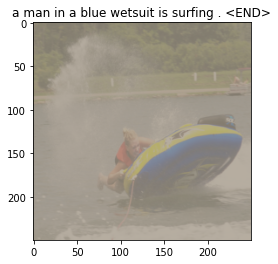

Epoch: 9 loss: 2.10207


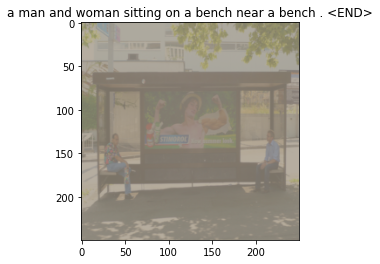

Epoch: 9 loss: 2.00026


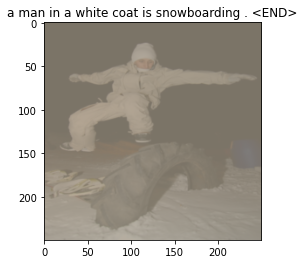

Epoch: 9 loss: 2.02863


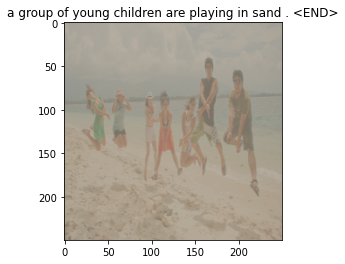

Epoch: 9 loss: 1.93636


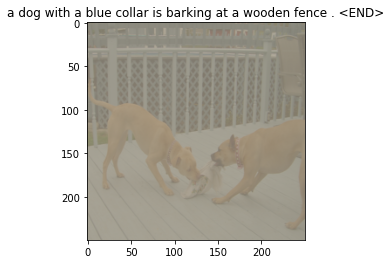

Epoch: 9 loss: 1.94843


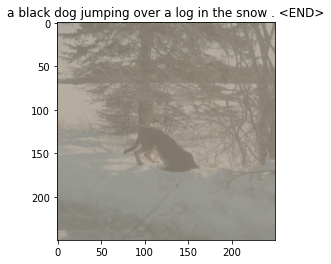

Epoch: 9 loss: 1.72298


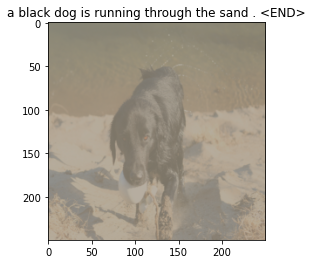

Epoch: 9 loss: 2.04828


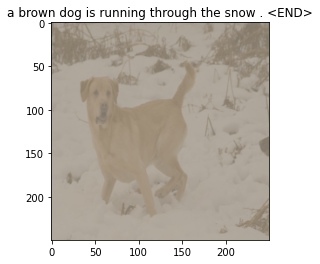

Epoch: 9 loss: 2.28680


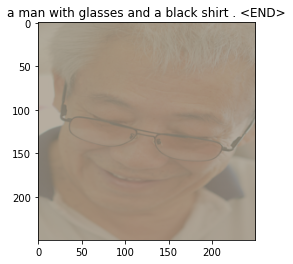

Epoch: 9 loss: 2.16019


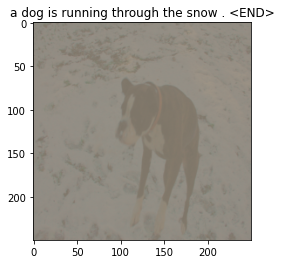

Epoch: 9 loss: 2.09571


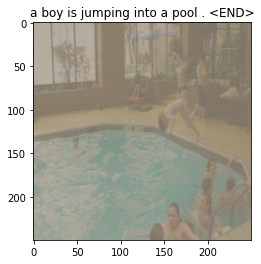

Epoch: 9 loss: 2.26660


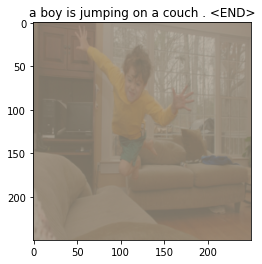

Epoch: 9 loss: 1.88359


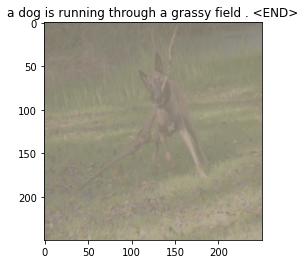

Epoch: 9 loss: 2.34848


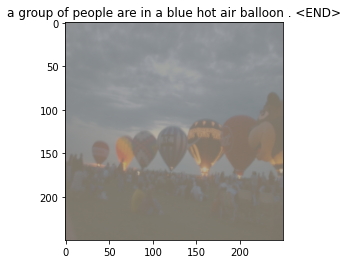

Epoch: 9 loss: 2.42042


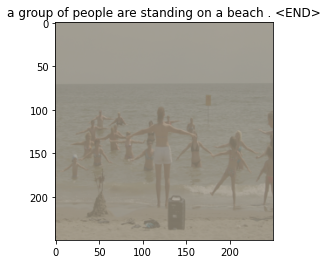

Epoch: 9 loss: 1.97640


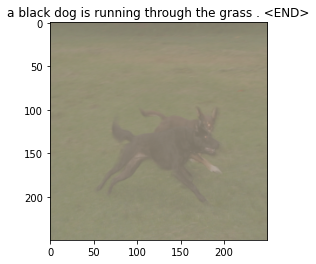

Epoch: 9 loss: 2.04720


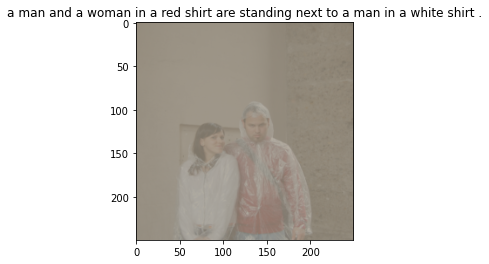

Epoch: 9 loss: 2.10018


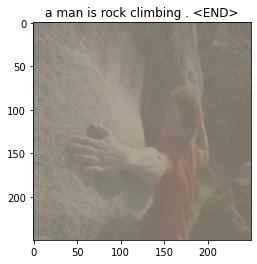

Epoch: 9 loss: 2.17403


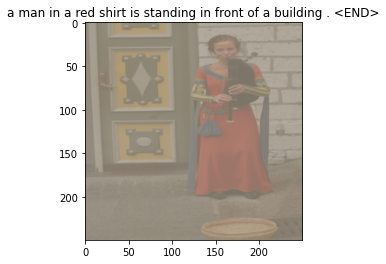

Epoch: 10 loss: 2.02671


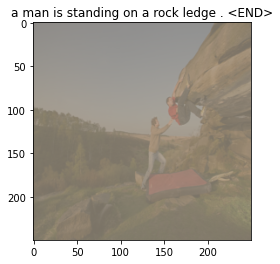

Epoch: 10 loss: 1.75850


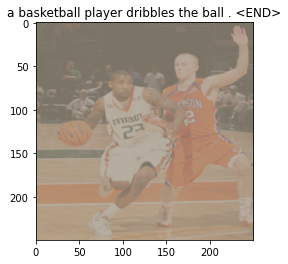

Epoch: 10 loss: 1.94470


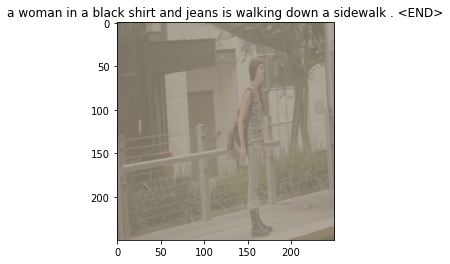

Epoch: 10 loss: 1.91496


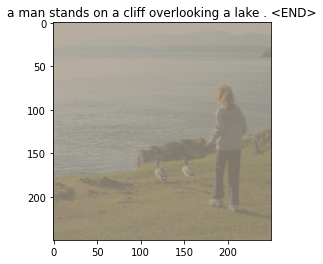

Epoch: 10 loss: 2.20571


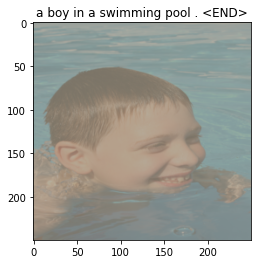

Epoch: 10 loss: 2.10542


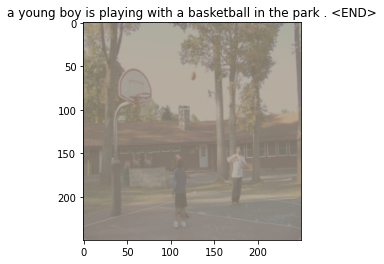

Epoch: 10 loss: 2.22485


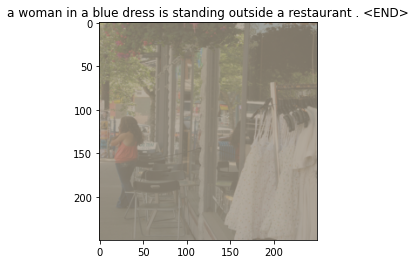

Epoch: 10 loss: 1.98082


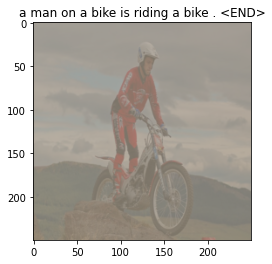

Epoch: 10 loss: 1.98600


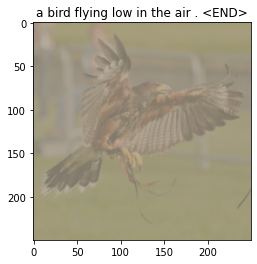

Epoch: 10 loss: 2.20872


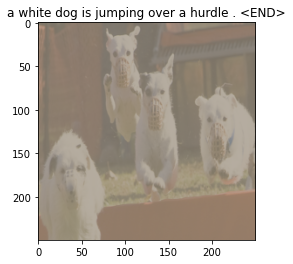

Epoch: 10 loss: 2.12337


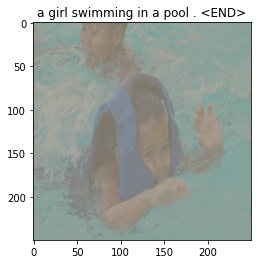

Epoch: 10 loss: 1.88109


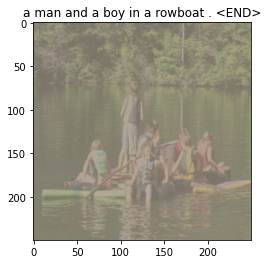

Epoch: 10 loss: 2.03862


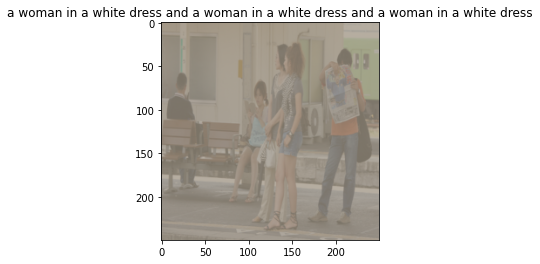

Epoch: 10 loss: 2.09771


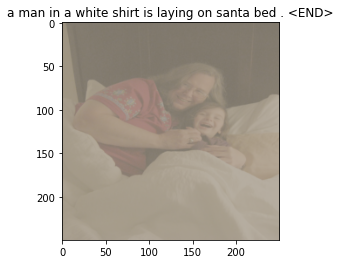

Epoch: 10 loss: 1.97357


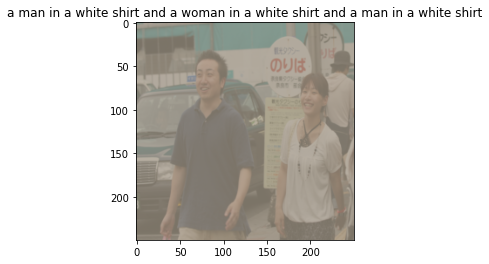

Epoch: 10 loss: 2.15570


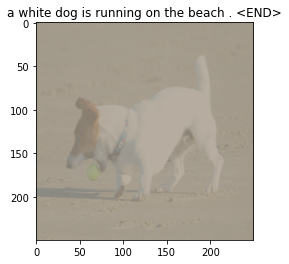

Epoch: 10 loss: 1.97942


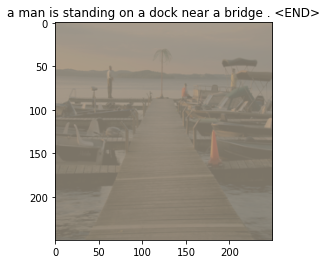

Epoch: 10 loss: 2.27060


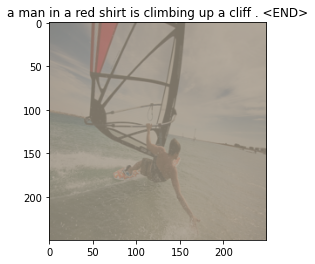

Epoch: 10 loss: 2.12204


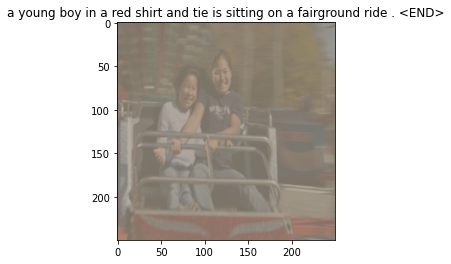

Epoch: 10 loss: 2.05400


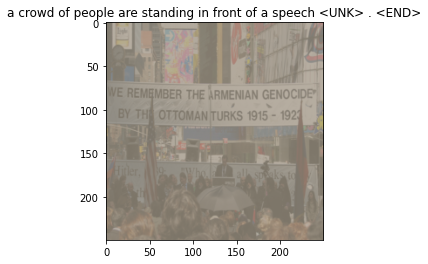

In [ ]:
for epoch in range(1, epochs + 1):   
    for idx, (image, captions) in enumerate(iter(data_loader)):
        image, captions = image.to(device), captions.to(device)

        # Zero the gradients
        optimizer.zero_grad()

        # Feed forward
        outputs, attentions = model(image, captions)

        # Loss
        targets = captions[:, 1:]
        loss = loss_criterion(outputs.view(-1, vocab_size), targets.reshape(-1))
        
        # Backward pass
        loss.backward()

        # Update the optimizer
        optimizer.step()

        if (idx + 1) % 100 == 0:
            print(f"Epoch: {epoch} loss: {loss.item():.5f}")
            
            # Generate the caption
            img, _ = next(iter(data_loader))
            generate_caption(model, img)
                
            model.train()
        
    save_model(model, epoch)

## 6 Visualizing the attentions
Defining helper functions
<li>Given the image generate captions and attention scores</li>
<li>Plot the attention scores in the image</li>

In [ ]:
def plot_attention(img, result, attention_plot):
    # Unnormalise
    img[0] = img[0] * 0.229 + 0.485
    img[1] = img[1] * 0.224 + 0.456
    img[2] = img[2] * 0.225 + 0.406
    
    img = img.numpy().transpose((1, 2, 0))
    temp_image = img

    fig = plt.figure(figsize=(15, 15))

    len_result = len(result)
    for l in range(len_result):
        temp_att = attention_plot[l].reshape(7, 7)
        
        ax = fig.add_subplot(len_result // 2, len_result // 2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.7, extent=img.get_extent())
        

    plt.tight_layout()
    plt.show()

In [ ]:
for _ in range(4):
    images, _ = next(iter(data_loader))

    img = images[0].detach().clone()
    img1 = images[0].detach().clone()
    caps, alphas = generate_caption(model, img.unsqueeze(0))

    plot_attention(img1, caps, alphas)

ValueError: ignored